<sub>Adapted from <i>Hands-On Machine Learning with Scikit-Learn, Keras, & Tensorflow</i> by Aurélien Géron</sub>

For this project we'll use the 1990 California Housing Prices dataset from the StatLib repository visualized below. For teaching purposes, Géron added an attribute and removed some features from the data.

<br />
<div>
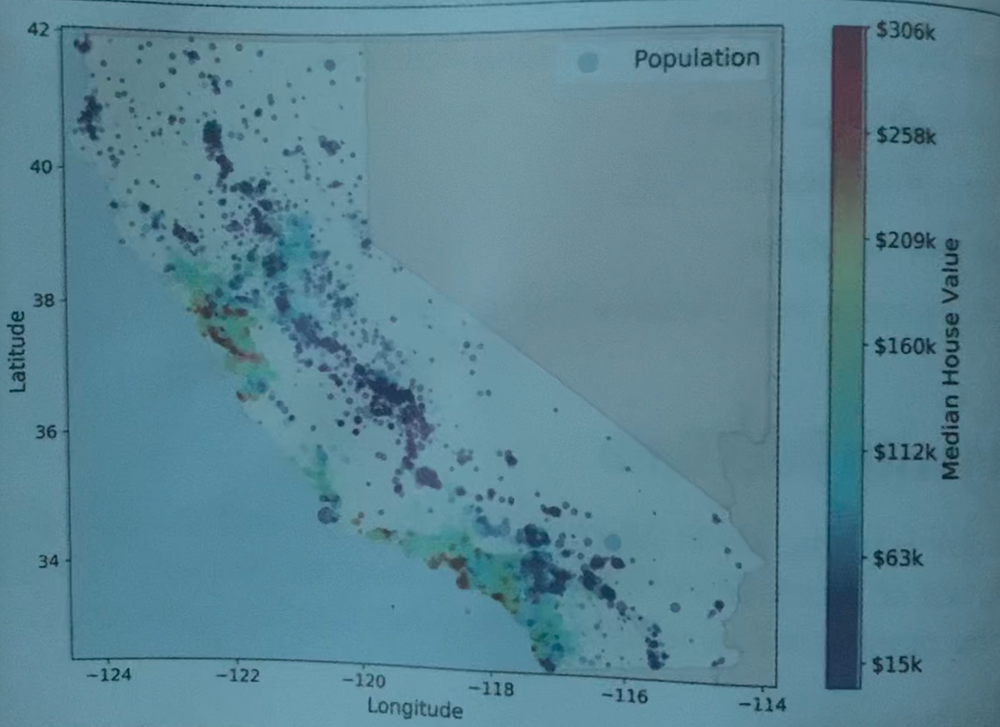
</div>
<br />


## The Scope of the Problem

At Machine Learning Housing Corporation, your first task is to use California census data to build a model of housing prices in the state in 1990. This data includes metrics such as the population, median income, and median housing price for each block group in California. Block groups are the smallest geographical unit for which the US Census Bureau publishes sample data (a  block group typically has a population of 600 to 3,000 people). We will call them 'districts' for short.

Your model should learn from this data and be able to predict the median housing price in any district, given all other metrics.

## Framing the Problem

The first question to ask the boss is what exactly the business objective is. Building a model is probably not the end goal. How does the company expect to use and benefit from the model? Knowing the objective is important because it will determine how you frame the problem, which algorithms you will select, which performance measure you will use to evaluate your model, and how much effort you will spend tweaking it.

Your boss answers that your model's output (a prediction of a district's median housing price) will be fed to another machine learning system (below), along with many other signals. This downstream system will determine whether it is worth investing in a given area or not. Getting this right is critical, as it directly affects revenue.

<br />
<div>
    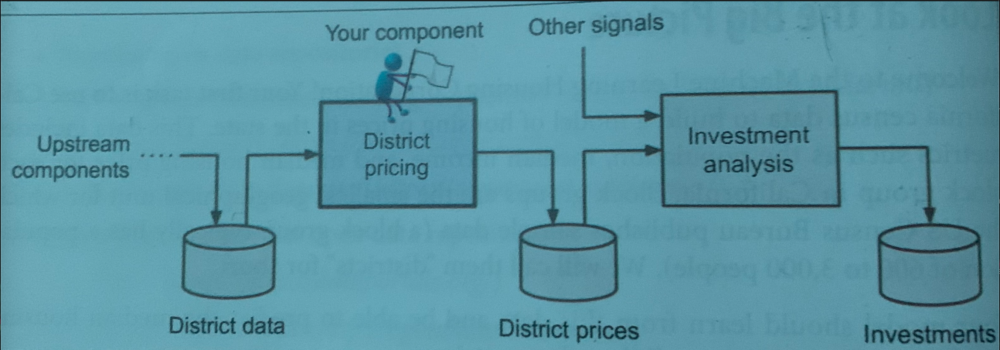
</div>
<br />
                                                

## Pipelines

A sequence of data processing components is called a data <i>pipeline</i>. Pipelines are very common in machine learning systems, since there is a lot of data to manipulate and many data transformations to apply.

Components typically run asynchronously. Each component pulls in a large amount of data, processes it, and outputs the result in another data store. Then, some time later, the next component in the pipeline pulls this data and outputs its own result. Each component is fairly self-contained: the interface between components is simply the data store. This makes the system simple to grasp with the help of data flow graphs, and different teams can focus on diffeent components. Moreover, if a component breaks down, the downstream components can often continue to run normally by using the last output from the broken component, making the architecture quite robust.


________

The next question to ask your boss is what the current solution looks like. The current situation will often give you a reference for performance, as well as insights on how to solve the problem. Your boss says that the district housing prices are currently estimated manually by experts; a team gathers up-to-date information about a district, and when they cannot get the median housing price, they estimate it using complex rules.

This is costly and time-consuming, and their estimates are not great; in cases where they manage to find out the actual median housing price, they often realize that their estimates were off by more than 20%. This is why the company thinks that it would be useful to train a model to predict a district's median housing price, given other data about the district. The census data looks like a great dataset to exploit for this purpose, since it includes the median housing prices of thousands of districts, as well as other data.

With all this information, you are now ready to start designing your system. First, you need to frame the problem: is it supervised, unsupervised, or reinforced learning? Is it a classification task, a regression task, or something else? Should you use batch learning or online learning techniques?

In this situation, it is clearly a typical supervised learning task, since you are given <i>labeled</i> training examples (each instance comes with the expected output, i.e. the district's median housing price). It can also be considered a typical regression task, since you are asked to predict a value. More specifically, this is a <i>multiple regression</i> problem, since the system will use multiple features to make a prediction (using the district's population, the median income, etc.). It is also an <i>univariate regression</i> problem, since we are only trying to predict a single value for each district. If we were trying to predict multiple values per district, it would be a <i>multivariate regression</i> problem. Finally, there is no continuous flow of data coming into the system, there is no particular need to adjust to changing data rapidly, and the data is small enough to fit in memory, so plain batch learning should do just fine.

## Selecting a Performance Measure

Your next step is to seelct a performance measure. A typical performance measure for regression problems is Root Mean Square Error (RMSE). It gives an idea of how much error the system typically makes in its predictions, with a higher weight for larger errors. The following equation shows the mathematical formula to compute RMSE.

$$
RMSE(X, h) = \sqrt{\frac{1}{m_i} \sum_{i=1}^{m} (h(\bf{x}^{(i)}) - y^{(i)})^2 }
$$

___

## Notations

This equation introduces several common machine learning notations that we will use throughout this book:


* <i>m</i> is the number of instances in the dataset you are measuring RMSE on.
    - For example, if you are evaluating the RMS Error on a validation set of 2,000 distrincts, then <i>m</i> = 2,000.
    

* $ \bf{x}^{(i)} $ is a vector of all the feature values (excluding the label) of the $ i^{th} $ instance in the dataset, and $ y^{(i)} $ is its label (the desired output value for that instance).
    - For example, if the first district in the dataset is located at longitude $ -118.29^{\circ} $, latitude $ 33.91^{\circ} $, and it has 1,416 inhabitants with a median income of 38,372 USD, and the median house value is 156,400 USD, then:
    
        $
        \bf{x}^{(1)} = \begin{pmatrix}
        -118.29\\
        33.91\\
        1,416\\
        38,372
        \end{pmatrix}
        $
        
    and:
    
        $
        y^{(1)} = 156,400
        $


* $ \bf{X} $ is a matrix containing all the feature values (excluding labels) of all instances in the dataset. There is one row per instance, and the $ i^{th} $ row is equal to the transpose of $ \bf{x}^{(i)} $, noted $ (\bf{x}^{(i)})^{T} $

    - For example, if the first district is as just described, then the matrix $ \bf{X} $ looks like this:
    
        $
        \bf{X} = \begin{pmatrix}
        ({x}^{(1)})^T\\
        ({x}^{(2)})^T\\
        ⋮\\
        ({x}^{(1999)})^T\\
        ({x}^{(2000)})^T\\
        \end{pmatrix}
        = \begin{pmatrix}
        -118.29 & 33.91 & 1,416 & 38,372\\
        ⋮ & ⋮ & ⋮ & ⋮
        \end{pmatrix}
        $


* $ \it{h} $ is your system's prediction function, also called a <i>hypothesis</i>. When your system is given an instance's feature vector $ \bf{x}^{(i)} $, it outputs a predicted value $ ŷ^{(i)} = \it{h}(\bf{x}^{(i)}) $ for that instance.

    - For example, if your system predicts that the median housing price in the first district is 158,400 USD, then $ ŷ^{(1)} = h(x^{(1)}) = 158,400 $. The prediction error for this district is $ ŷ^{(1)} - y^{(1)} = 2,000 $.


* RMSE(X, h) is the cost function measured on the set of examples using your hypothesis $ \it{h} $.

___

Even though the RMSE is generally the preffered performance measure for regression tasks, in some contexts you may prefer to use another function. For example, suppose that there are many outlier districts. In that case, you may consider using $ \it{mean \space absolute \space error} $ (MAE), also knows as the average absolute deviation:

$$
MAE(X,h) = \frac{1}{m} \sum_{i=1}^{m} \mid h(x^{(i)} - y^{(i)}) \space\mid
$$

Both the RMSE and the MAE are ways to measure the distance between two vectors: the vector of predictions and the vector of target values. Various distance measures, or $ \it{norms} $, are possible:

* Computing the root of a sum of squares (RMSE) corresponds to the $ \it{Euclidean norm} $: this is the notion of distance with which we are normally familiar. It is also called the $ \it{ℓ_{2}} $, noted $ \mid\mid • \mid\mid_{2} $ or $ \mid\mid • \mid\mid_{2} $.


* Computing the sum of absolutes (MAE) corresponds to the $ ℓ_{1} \space \it{norm}$, noted $ \mid\mid • \mid\mid_{1} $. This is sometimes called the $ \it{Manhattan norm} $ because it measures the distance between two points in a city if you can only travel along orthogonal city blocks.


* More generally, the $ ℓ_{k} \space \it{norm}$ of a vector $ \bf{v} $ containing $ \it{n} $ elements is defined as $ \mid\mid v \mid\mid_{k} \space = \space (\mid v_{0} \mid^{k} + \mid v_{1} \mid^{k} + \space ... \space + \mid v_{n} \mid^{k})^{\frac{1}{k}} · ℓ_{0} $ gives the number of nonzero elements in the vector, and $ ℓ_{\infty} $ gives the maximum absolute value in the vector.


* The higher the norm index, the more it focuses on large values and neglects small ones. This is why RMSE is more sensitive to outliers than the MAE. However when outliers are expoinentially rare (like in a normal distribution), the RMSE performs very well and is thus generally preferred.

## Checking the Assumptions

Lastly, it is good practice to list and verify the assumptions that have been made so far; this can help catch serious issues early on. For example, the district prices that your system outputs are going to be fed into a downstream machine learning system, and you assume that these prices are going to be used as such. But what if the downstream system converts the prices into categories (e.g., 'cheap', 'medium', or 'expensive') and then uses those categories instead of the prices themselves? In this case, getting the price perfectly right is not important at all; your system just needs to get the category right. If that's so, then the problem should have been framed as a classification task, not a regression task.

In [ ]:
# >> refer to https://github.com/ageron/handson-ml2